In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from scipy.stats import f_oneway, shapiro, kstest, kruskal
from scipy.stats import mannwhitneyu, wilcoxon
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import warnings
warnings.filterwarnings('ignore')

cum_min = [i for i in range(0, 121, 20)]
cum_min.append(125)
cum_min.extend([i for i in range(145, 248, 20)])
cum_min.append(250)
cum_min.extend([i for i in range(270, 375, 20)])
cum_min = ["{}:{:02}".format(*divmod(int(x), 60)) for x in cum_min]

In [2]:
##### Define the location of your data directory ##########
path = r'D:\\Seat_study1\\output_data\\'

### Time series plots

In [3]:
df_extract_features_all = pd.read_csv(path + 'df_pressure_motion_features_all.csv', usecols = ['frame_time', 'subject','diff_centroid'])
display(df_extract_features_all[:2])
df_icm_peak = pd.read_csv(path + 'df_icm_press_centroid.csv', usecols = ['frame_time', 'subject', 'sum_pressure_60sec', 'lower_limit_pressdiff', 
                                                                                                'upper_limit_pressdiff', 'diff_tot_pressure',
                                                                                                'centroid_pairwise_dist','lower_limit_centroid', 'upper_limit_centroid'])
df_icm_peak = df_icm_peak.merge(df_extract_features_all, on = ['subject', 'frame_time'], how = 'left')
df_icm_peak.frame_time = pd.to_datetime(df_icm_peak.frame_time)
#df_icm_peak.index = df_icm_peak.frame_time
df_icm_peak[:2]

,frame_time,subject,diff_centroid
0,2024-06-23 13:07:01,A001,0.0000
1,2024-06-23 13:07:02,A001,-0.0483


,subject,frame_time,centroid_pairwise_dist,sum_pressure_60sec,diff_tot_pressure,lower_limit_centroid,upper_limit_centroid,lower_limit_pressdiff,upper_limit_pressdiff,diff_centroid
0,A001,2024-06-23 13:27:01,0.6001,234.33,-8.10,-0.487095,0.569919,-10.917221,11.183834,0.5777
1,A001,2024-06-23 13:27:02,0.2280,237.11,2.78,-0.487095,0.569919,-10.917221,11.183834,-0.3721


In [4]:
subject_name = 'A023'
df = df_icm_peak[df_icm_peak.subject == subject_name]
df.index = range(0, len(df))
df = df.loc[:len(df)/2]
df.index = df.index/60

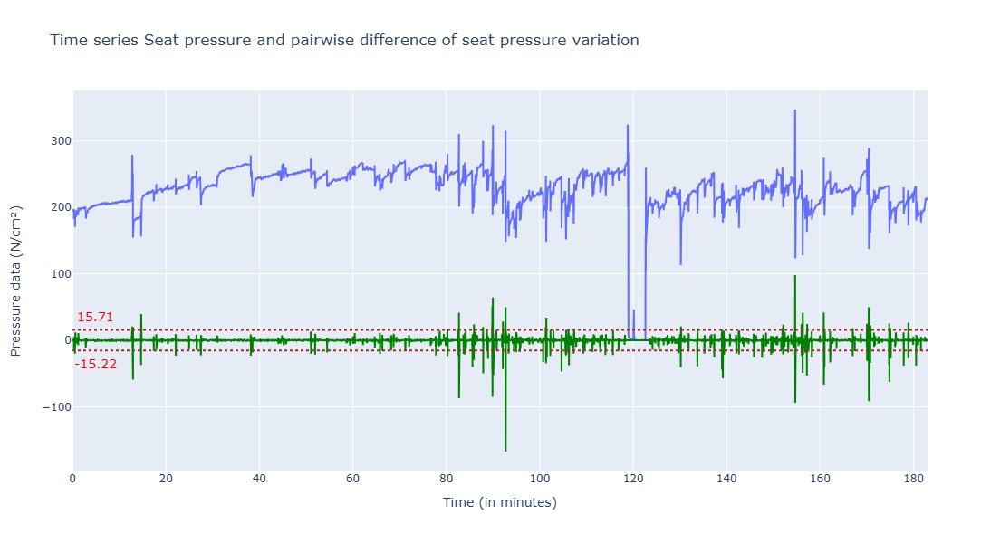

In [5]:
fig = go.Figure()
fig.add_trace(
    go.Scatter(x=list(df.index), y=list(df.sum_pressure_60sec),
               name = 'Total pressure', line = {'dash': 'solid', 'color' :'light blue'}, marker=dict(opacity= 0.5),mode = 'lines'))
fig.add_trace(
            go.Scatter(x=df.index, y=list(df.diff_tot_pressure),
                       name = 'Pairwise pressure difference', line = {'dash': 'solid' , 'color' :'green'},marker=dict(opacity= 0.9), mode = 'lines'))

fig.add_trace(go.Scatter(x=list(df.index), y=list(df.lower_limit_pressdiff),
                       name = 'Lower limit',mode = 'lines', line=dict(color='firebrick', width=2, dash='dot')))
fig.add_trace(go.Scatter(x=list(df.index), y=list(df.upper_limit_pressdiff),
                       name = 'Upper limit',mode = 'lines', line=dict(color='firebrick', width=2, dash='dot')))

fig.add_annotation(x=5, y=df.lower_limit_pressdiff[0]-20, text=round(df.lower_limit_pressdiff[0],2), showarrow=False, font=dict(size=14, color="red") )
fig.add_annotation(x=5, y=df.upper_limit_pressdiff[0]+20, text=round(df.upper_limit_pressdiff[0],2), showarrow=False, font=dict(size=14, color="red") )

fig.update_traces(hoverinfo="name+text", showlegend=False)
fig.update_layout(title="Time series Seat pressure and pairwise difference of seat pressure variation", height=600, width=1100,
                 xaxis=dict(title=dict(text="Time (in minutes)")),
                 yaxis=dict(title=dict(text="Presssure data (N/cm\u00b2)")))
        
fig.show()

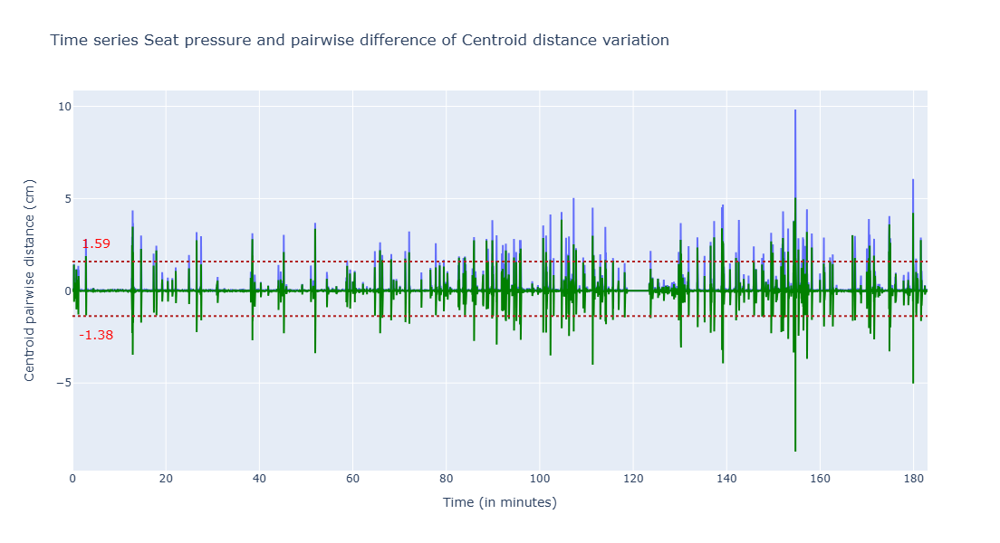

In [6]:
fig = go.Figure()
fig.add_trace(
    go.Scatter(x=list(df.index), y=list(df.centroid_pairwise_dist),
               name = 'Centroid distance', line = {'dash': 'solid', 'color' :'light blue'}, marker=dict(opacity= 0.5),mode = 'lines'))
fig.add_trace(
            go.Scatter(x=df.index, y=list(df.diff_centroid),
                       name = 'Pairwise centroid distance difference', line = {'dash': 'solid' , 'color' :'green'},marker=dict(opacity= 0.9), mode = 'lines'))

fig.add_trace(go.Scatter(x=list(df.index), y=list(df.lower_limit_centroid),
                       name = 'Lower limit',mode = 'lines', line=dict(color='firebrick', width=2, dash='dot')))
fig.add_trace(go.Scatter(x=list(df.index), y=list(df.upper_limit_centroid),
                       name = 'Upper limit',mode = 'lines', line=dict(color='firebrick', width=2, dash='dot')))

fig.add_annotation(x=5, y=df.lower_limit_centroid[0]-1, text=round(df.lower_limit_centroid[0],2), showarrow=False, font=dict(size=14, color="red") )
fig.add_annotation(x=5, y=df.upper_limit_centroid[0]+1, text=round(df.upper_limit_centroid[0],2), showarrow=False, font=dict(size=14, color="red") )

fig.update_traces(hoverinfo="name+text", showlegend=False, overwrite=True)
fig.update_layout(title="Time series Seat pressure and pairwise difference of Centroid distance variation", height=600, width=1150,
                 xaxis=dict(title=dict(text="Time (in minutes)")),
                  yaxis=dict(title=dict(text="Centroid pairwise distance (cm)")))
        
fig.show()

## Plot errorbars on ICM for all methods

In [7]:
def plot_error_bar(df, col):
    temp = df[['time', col]]
    # Calculate mean and standard deviation for each day
    mean_by_day = temp.groupby('time')[col].mean().reset_index()
    std_by_day = df.groupby('time')[col].std().reset_index()
    
    # Combine into a single dataframe for easier plotting
    stats_df = pd.merge(mean_by_day, std_by_day, on='time', suffixes=('_mean', '_std'))
    stats_df.time = stats_df.time.astype(str)
    fig = go.Figure()
    fig = go.Figure(data=[
    go.Bar(
        x=stats_df['time'],
        y=stats_df[col+'_mean'],
        error_y=dict(
            type='data',        # Specifies that the error values are data-based
            array=stats_df[col+'_std'], # The array of standard deviations
            visible=True        # Makes the error bars visible
        )
    )
    ])
    fig.update_layout(
    title="Mean Total ICM with Standard Deviation Error Bars by Day",
    xaxis_title="Sitting durantion",
    yaxis_title="ICM",
    template="simple_white" # Optional: provides a cleaner look
    )
    
    fig.show()

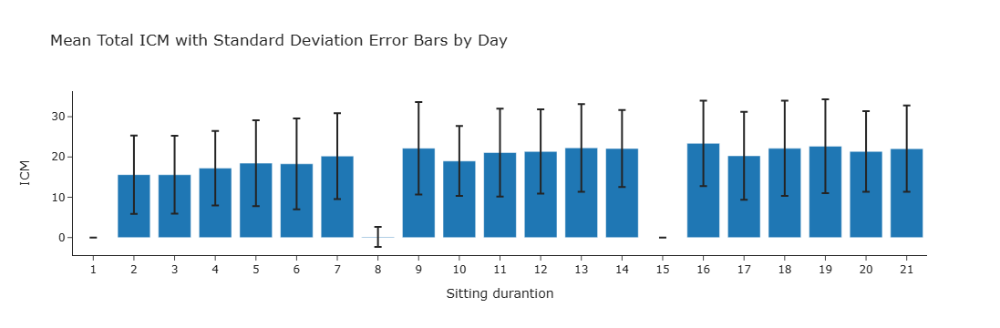

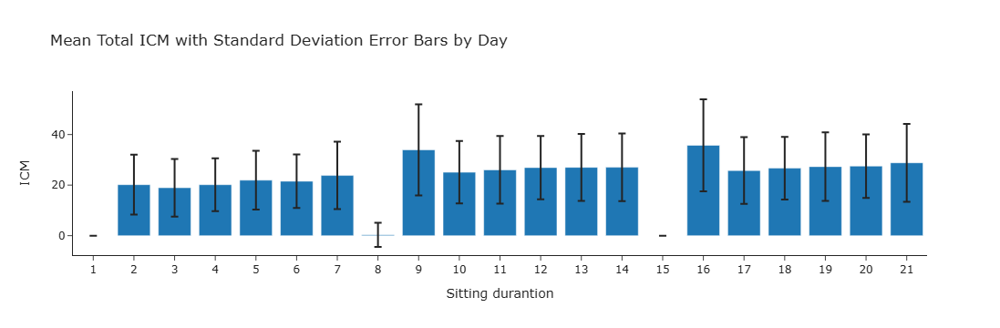

In [8]:
df = pd.read_csv(path + 'df_icm.csv', usecols= ['subject', 'variable', 'icm_pressdiff_count' , 'icm_centroid_count'])
df['time'] = list(range(1, 22, 1))*df.subject.nunique()
df['variable'] = cum_min*df.subject.nunique()
#df = df[~((df.time == 1) | (df.time == 8) | (df.time == 15))]  ####### To remove instances of Toilet break
col = 'icm_pressdiff_count'
plot_error_bar(df, col)
col = 'icm_centroid_count'
plot_error_bar(df, col)

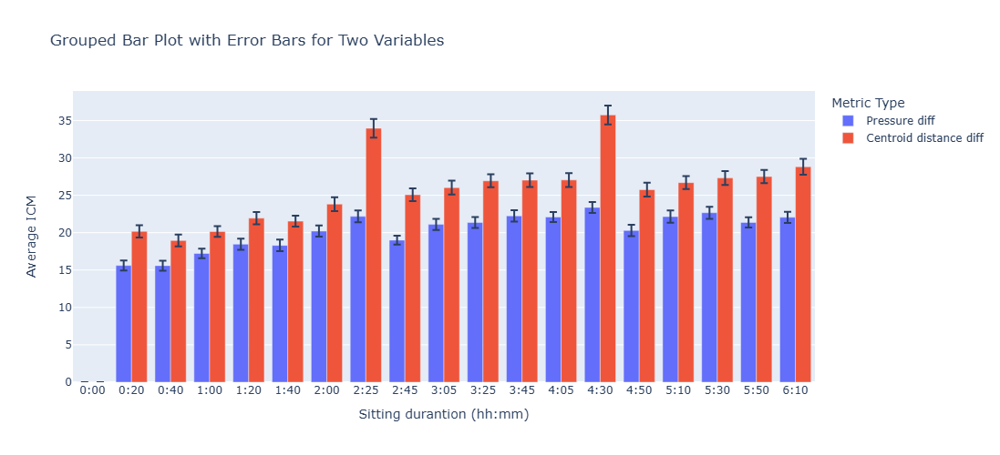

In [9]:
df_merge = pd.DataFrame()
time_col = 'variable'
var_dict = {'icm_pressdiff_count': 'Pressure diff', 'icm_centroid_count': 'Centroid distance diff'}
for col in ['icm_pressdiff_count', 'icm_centroid_count']:
    #df[col] =  df.groupby('subject')[col].cumsum()
    temp = df[[time_col, col]]
    # Calculate mean and standard deviation for each day
    mean = temp.groupby(time_col)[col].mean().reset_index()
    std = df.groupby(time_col)[col].sem().reset_index()
    
    # Combine into a single dataframe for easier plotting
    stats_df = pd.merge(mean, std, on = time_col)
    stats_df.columns = [time_col, 'mean', 'std']
    stats_df['var'] = var_dict[col]
    stats_df[time_col] = stats_df[time_col].astype(str)
    stats_df = stats_df[~((stats_df[time_col] == '2:05') | (stats_df[time_col] == '4:10'))]
    df_merge = pd.concat([df_merge, stats_df], axis =0)
fig = px.bar(df_merge,
             x=time_col,
             y="mean",
             color="var", # This groups the bars by metric
             barmode='group', # Ensures bars are side-by-side
             error_y="std", # Column containing error values
             title="Grouped Bar Plot with Error Bars for Two Variables")

# Customize the plot
fig.update_layout(xaxis_title="Sitting durantion (hh:mm)",
                  yaxis_title="Average ICM",
                  legend_title="Metric Type", width = 1100, height=500)
# Display the figure
fig.show()

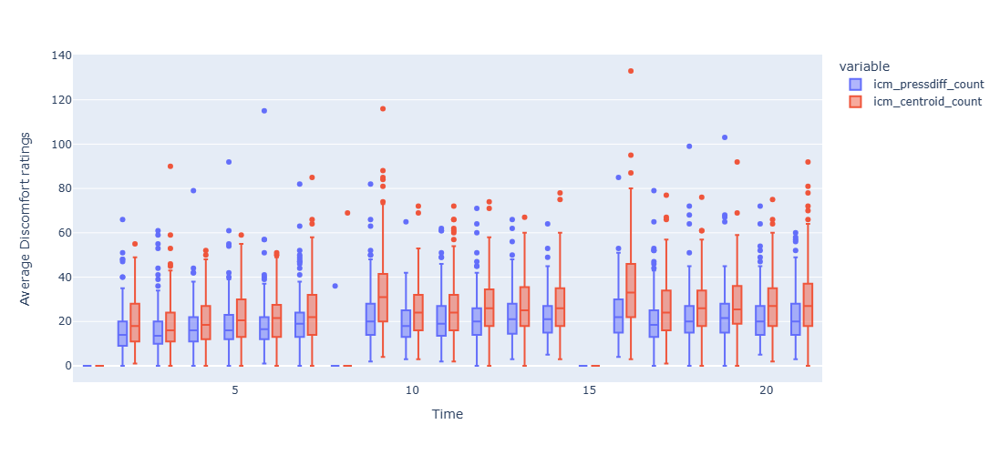

In [10]:
temp = pd.melt(df, id_vars = ['time'], value_vars= ['icm_pressdiff_count' , 'icm_centroid_count'])
fig = px.box(temp, x="time", y= 'value', color='variable')
fig.update_layout(width=1100, height=500, xaxis_title= 'Time', yaxis_title = 'Average Discomfort ratings')
fig.show();

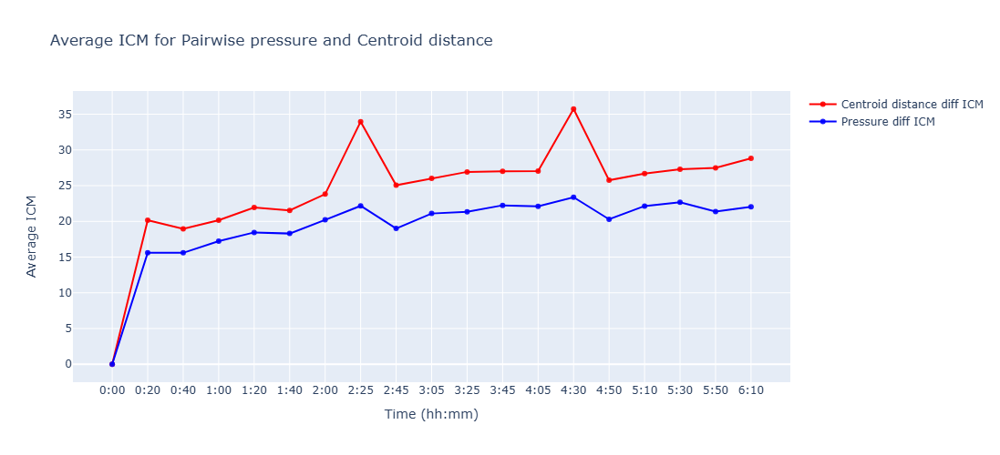

In [11]:
temp = pd.melt(df, id_vars = ['icm_pressdiff_count' , 'icm_centroid_count'], value_vars= ['variable'])
temp = temp.groupby(by='value')[['icm_pressdiff_count' , 'icm_centroid_count']].mean().reset_index(drop=False)
temp = temp.drop([7, 14], axis=0)
fig = go.Figure()
fig.add_trace(
            go.Scatter(x=temp.value, y=list(temp.icm_centroid_count),
                       name = 'Centroid distance diff ICM', line = {'dash': 'solid' , 'color' :'red'},marker=dict(opacity= 0.9), mode = 'lines+markers'))
fig.add_trace(
    go.Scatter(x=list(temp.value), y=list(temp.icm_pressdiff_count),
               name = 'Pressure diff ICM', line = {'dash': 'solid', 'color' :'blue'}, marker=dict(opacity= 0.9),mode = 'lines+markers'))

fig.update_traces(hoverinfo="name+text", showlegend=True)
fig.update_layout(title="Average ICM for Pairwise pressure and Centroid distance", height=500, width=1100,
                 xaxis = dict(title=dict(text="Time (hh:mm)")),
                 yaxis = dict(title=dict(text="Average ICM")))
fig.show()

## Significant test between different methods of ICM

In [12]:
display(df[:2])
df = df[~((df.time == 8) | (df.time == 15))]  ### 6-hours except Toilet break
#df = df[~((df.Variable == 8) | (df.Variable >= 15))]  ### ICM for starting 4-hours
#df = df[~((df.Variable <= 8) | (df.Variable == 15))]  ### ICM for the last 4-hours
df = df.groupby(by = 'subject')[['icm_pressdiff_count', 'icm_centroid_count']].mean().reset_index()
df[:2]

,subject,variable,icm_pressdiff_count,icm_centroid_count,time
0,A001,0:00,0,0,1
1,A001,0:20,9,13,2


,subject,icm_pressdiff_count,icm_centroid_count
0,A001,14.000000,22.736842
1,A002,22.947368,28.000000


In [13]:
all = ['icm_pressdiff_count', 'icm_centroid_count']
#perform Kolmogorov-Smirnov test for normality
for icm_method in all:
    if kstest(df[icm_method], 'norm').pvalue> 0.05:
        print('Normal')
    else:
        print('Not Normal')

statistic, test_pvalue = mannwhitneyu(df[all[0]], df[all[1]])
# Interpret the result (using a significance level of 0.05)
if test_pvalue < 0.05:
    print("Result: Reject the null hypothesis - there is a significant difference between group means.")
else:
    print("Result: No significant difference between group means.")

statistic, test_pvalue = mannwhitneyu(df[all[0]], df[all[1]], alternative='less') ### x<y
# Interpret the result (using a significance level of 0.05)
if test_pvalue < 0.05:
    print("Result: Reject the null hypothesis - Significant difference between group mean 1 < group mean 2, p-value.", round(test_pvalue, 8))
else:
    print("Result: No Significant difference between group means.")

statistic, test_pvalue = mannwhitneyu(df[all[0]], df[all[1]], alternative='greater') ### x>y
# Interpret the result (using a significance level of 0.05)
if test_pvalue < 0.05:
    print("Result: Reject the null hypothesis - Significant difference between group mean 1 > group mean 2, p-value.", round(test_pvalue, 5))
else:
    print("Result: No significant difference between group means.")

Not Normal
Not Normal
Result: Reject the null hypothesis - there is a significant difference between group means.
Result: Reject the null hypothesis - Significant difference between group mean 1 < group mean 2, p-value. 0.0
Result: No significant difference between group means.


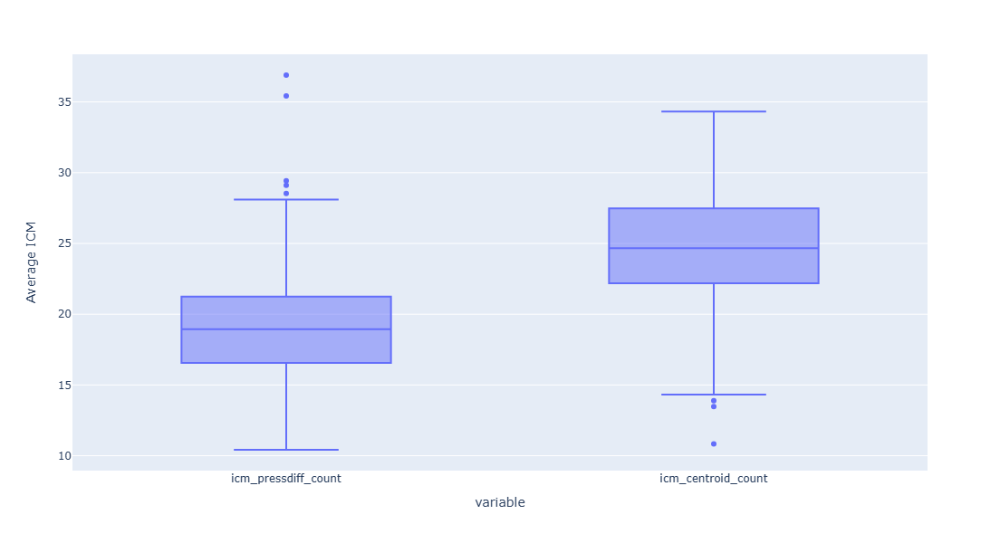

In [14]:
fig = px.box(df,  y= all)
fig.update_layout(width=600, height=600, yaxis_title = 'Average ICM')
fig.show();

## Correlation between ICM and Discomfort ratings

208


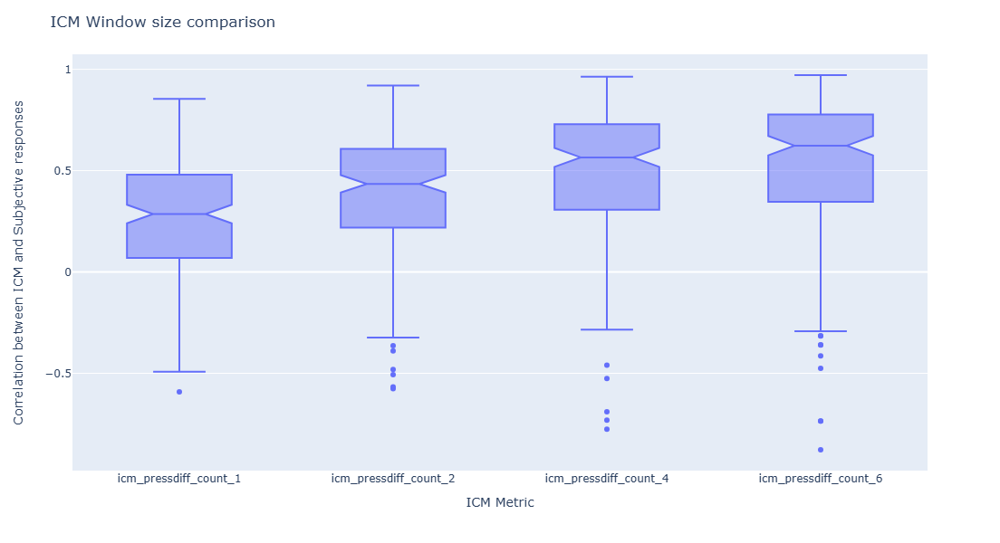

,Subject,feature,corr
0,A0SQ,icm_pressdiff_count_1,0.120506
1,A0SQ,icm_pressdiff_count_2,0.425957


In [15]:
df = pd.read_excel(path + '0401_cont_1to19_corr19.xlsx', usecols=['Subject', 'feature', 'corr'])
print(df.Subject.nunique())
df = df[df['feature'].isin(['icm_pressdiff_count_1', 'icm_pressdiff_count_2', 'icm_pressdiff_count_4', 'icm_pressdiff_count_6'])]

fig = px.box(df, x = 'feature',  y= 'corr', notched = True)

fig.update_layout(width=500, height=600,  xaxis_title = 'ICM Metric', yaxis_title = 'Correlation between ICM and Subjective responses',
                 title = 'ICM Window size comparison')
fig.show();
df[:2]

208


,Subject,feature,corr
0,A0SQ,1-window ICM,0.120506
5,A0SQ,6-window ICM,0.176368


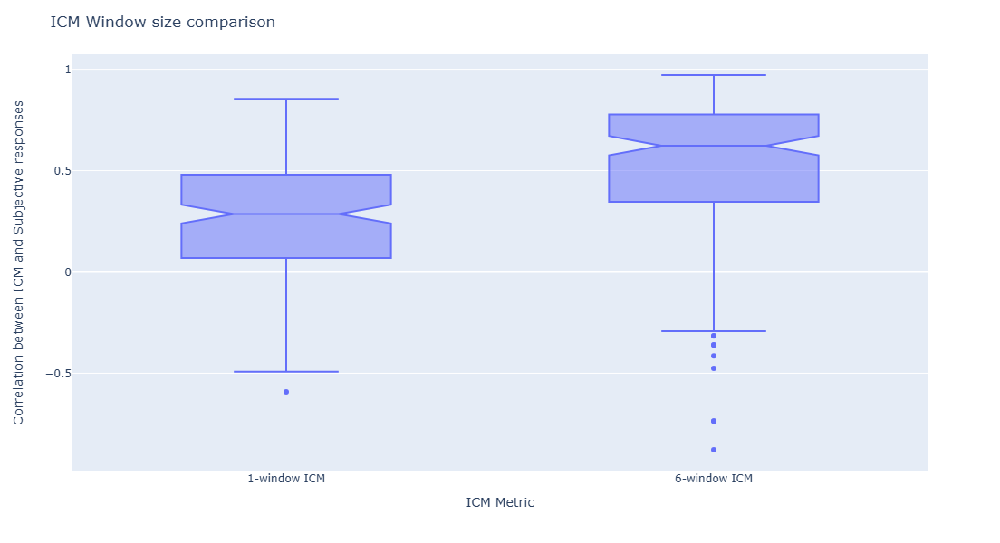

In [16]:
df = pd.read_excel(path + '0401_cont_1to19_corr19.xlsx', usecols=['Subject', 'feature', 'corr'])
print(df.Subject.nunique())
df = df[df['feature'].isin(['icm_pressdiff_count_1', 'icm_pressdiff_count_6'])]
df['feature'] = df.feature.apply( lambda x: '1-window ICM' if x=='icm_pressdiff_count_1' else '6-window ICM')
display(df[:2])
fig = px.box(df, x = 'feature',  y= 'corr', notched = True)

fig.update_layout(width=500, height=600,  xaxis_title = 'ICM Metric', yaxis_title = 'Correlation between ICM and Subjective responses',
                 title = 'ICM Window size comparison')
fig.show();

In [18]:
df.loc[df.feature == icm_method, 'corr']

Series([], Name: corr, dtype: float64)

In [21]:
df = df.dropna().reset_index(drop=True)
all = ['1-window ICM', '6-window ICM']
for icm_method in all:
    if shapiro(df.loc[df.feature == icm_method, 'corr']).pvalue> 0.05:
        print('Normal')
    else:
        print('Not Normal')

statistic, test_pvalue = mannwhitneyu(df.loc[df.feature == all[0], 'corr'], df.loc[df.feature == all[1], 'corr'])
# Interpret the result (using a significance level of 0.05)
if test_pvalue < 0.05:
    print("Result: Reject the null hypothesis - there is a significant difference between group means.")
else:
    print("Result: No significant difference between group means.", test_pvalue)

statistic, test_pvalue = mannwhitneyu(df.loc[df.feature == all[0], 'corr'], df.loc[df.feature == all[1], 'corr'], alternative='less') ### x<y
# Interpret the result (using a significance level of 0.05)
if test_pvalue < 0.05:
    print("Result: Reject the null hypothesis - Significant difference between group mean 1 < group mean 2, p-value.", round(test_pvalue, 8))
else:
    print("Result: No Significant difference between group means.")

Not Normal
Not Normal
Result: Reject the null hypothesis - there is a significant difference between group means.
Result: Reject the null hypothesis - Significant difference between group mean 1 < group mean 2, p-value. 0.0


### ICM vs Correlation plot

,subject,variable,icm_pressdiff_count,total_rating,icm_centroid_count,time
17,A059,rating18,36,1.9,51,5:10
18,A059,rating19,24,1.8,28,5:30
19,A059,rating20,35,1.8,45,5:50
20,A059,rating21,28,2.2,40,6:10


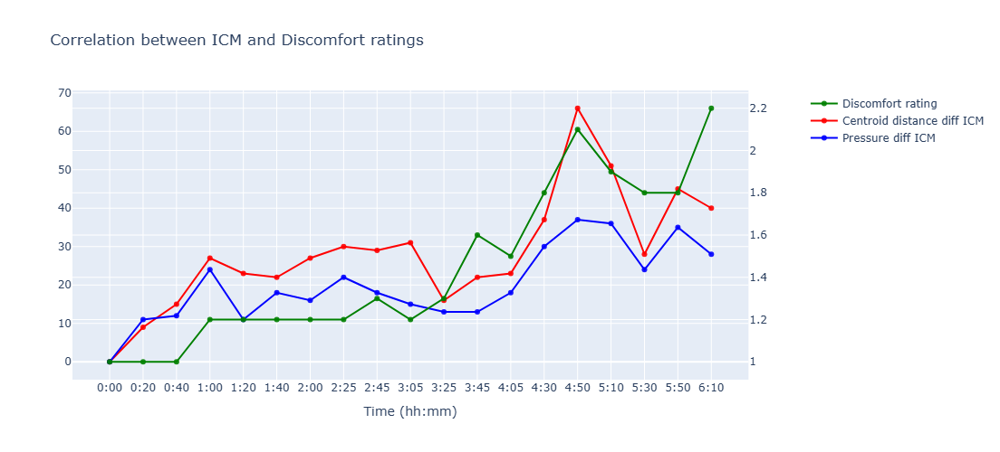

In [22]:
df = pd.read_csv(path + 'df_icm.csv', usecols= ['subject' , 'variable', 'total_rating', 'icm_pressdiff_count', 'icm_centroid_count'])
df = df[df.subject == 'A059'].reset_index(drop=True)
df['time'] = cum_min
df['total_rating'] = df['total_rating']/10
df = df[~((df['time'] == '2:05') | (df['time'] == '4:10'))]
display(df[-4:])
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
            go.Scatter(x=df.time, y=list(df.total_rating),
                       name = 'Discomfort rating', line = {'dash': 'solid' , 'color' :'green'},marker=dict(opacity= 0.9), mode = 'lines+markers'), secondary_y=True)

fig.add_trace(
            go.Scatter(x=df.time, y=list(df.icm_centroid_count),
                       name = 'Centroid distance diff ICM', line = {'dash': 'solid' , 'color' :'red'},marker=dict(opacity= 0.9), mode = 'lines+markers'))
fig.add_trace(
    go.Scatter(x=df.time, y=list(df.icm_pressdiff_count),
               name = 'Pressure diff ICM', line = {'dash': 'solid', 'color' :'blue'}, marker=dict(opacity= 0.9),mode = 'lines+markers'))

fig.update_traces(hoverinfo="text", showlegend=True)
fig.update_layout(title="Correlation between ICM and Discomfort ratings", height=500, width=1100,
                 xaxis = dict(title=dict(text="Time (hh:mm)")))
fig.show()

(3952, 6) 3952


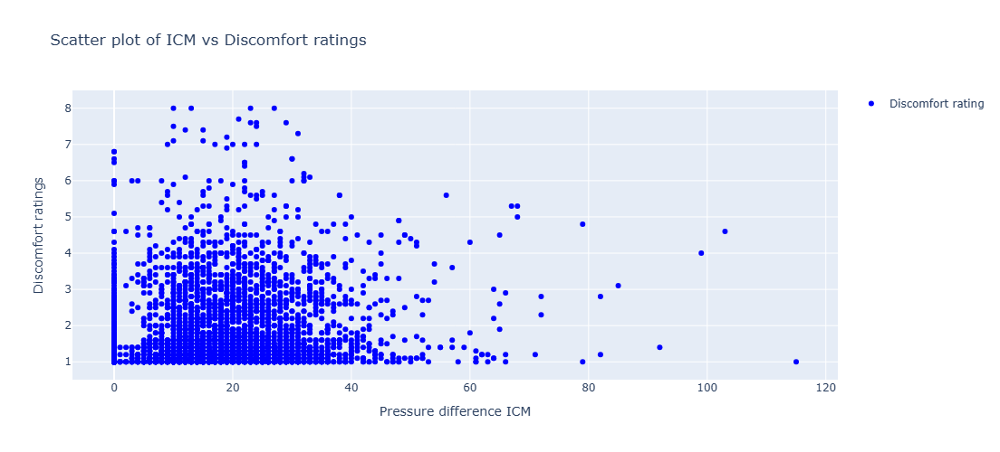

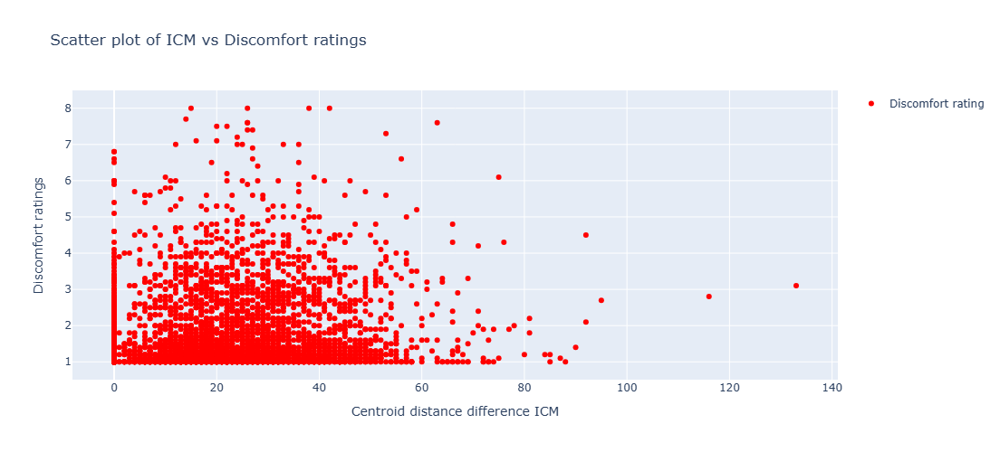

In [23]:
df = pd.read_csv(path + 'df_icm.csv', usecols= ['subject' , 'variable', 'total_rating', 'icm_pressdiff_count', 'icm_centroid_count'])
#df = df[df.subject == 'A059'].reset_index(drop=True)        ############## To create scatter plot for anyone given participant
df['time'] = np.repeat(cum_min, 208)
df['total_rating'] = df['total_rating']/10
df = df[~((df['time'] == '2:05') | (df['time'] == '4:10'))]
print(df.shape, 19*208)
fig = go.Figure()
fig.add_trace(
            go.Scatter(x=df.icm_pressdiff_count, y=list(df.total_rating),
                       name = 'Discomfort rating', line = {'dash': 'solid' , 'color' :'blue'},mode = 'markers'))


fig.update_traces(hoverinfo="text", showlegend=True)
fig.update_layout(title="Scatter plot of ICM vs Discomfort ratings", height=500, width=900,
                 xaxis = dict(title=dict(text="Pressure difference ICM")),
                 yaxis_title = 'Discomfort ratings')
fig.show()

fig = go.Figure()
fig.add_trace(
            go.Scatter(x=df.icm_centroid_count, y=list(df.total_rating),
                       name = 'Discomfort rating', line = {'dash': 'solid' , 'color' :'red'}, mode = 'markers'))


fig.update_traces(hoverinfo="text", showlegend=True)
fig.update_layout(title="Scatter plot of ICM vs Discomfort ratings", height=500, width=900,
                 xaxis = dict(title=dict(text='Centroid distance difference ICM')),
                 yaxis_title = 'Discomfort ratings')
fig.show()
#display(df[['total_rating', 'icm_pressdiff_count', 'icm_centroid_count']].corr())

## Compare correlation between two methods

In [24]:
def read_corr_data():
    df_ratings_all = pd.read_csv(path + 'df_ratings_all.csv', usecols=['subject', 'Significant', 'slope_hour', 'slope_group', 'slope_direction', 'Weight_status'])
    df = pd.read_csv(path + 'Corr_icm_rating_all.csv', usecols = ['subject', 'pressurediff_pval', 'corr_pressdiff',  'corr_centroid'])
    df = df.merge(df_ratings_all[['subject', 'Significant', 'slope_hour', 'slope_group', 'slope_direction', 'Weight_status']], on = 'subject', how = 'inner')
    #display(df.shape, df.pressurediff_pval.value_counts())
    return df

### All subjects

In [27]:
df = read_corr_data()
#df = df[df.slope_direction != 'C']    ############### Ignoring those subejcts with COnstant Rating slope
display(df.shape)
display(df[:2])
all = ['corr_pressdiff', 'corr_centroid']
#perform Kolmogorov-Smirnov test for normality
for icm_method in all:
    if kstest(df[icm_method], 'norm').pvalue> 0.05:
        print('Normal')
    else:
        print('Not Normal')

statistic, test_pvalue = mannwhitneyu(df[all[0]], df[all[1]])
# Interpret the result (using a significance level of 0.05)
if test_pvalue < 0.05:
    print("Result: Reject the null hypothesis - there is a significant difference between group means.")
else:
    print("Result: No significant difference between group means.", test_pvalue)

(208, 9)

,subject,corr_pressdiff,corr_centroid,pressurediff_pval,Significant,slope_hour,slope_group,slope_direction,Weight_status
0,A001,0.575,0.404,Correlated,True,1.32,Below_3.1hrs,P,Healthy
1,A002,0.120,0.194,Uncorrelated,True,0.90,Below_3.1hrs,P,Healthy


Not Normal
Not Normal
Result: No significant difference between group means. 0.34285472645528725


(208, 9)

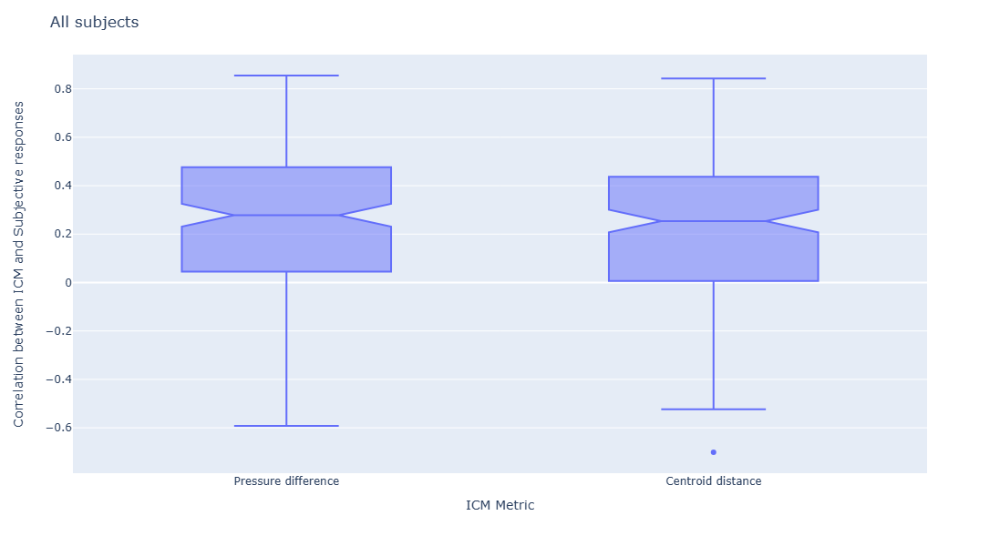

,Pressure difference,Centroid distance,slope_hour
count,208.000000,208.000000,208.000000
mean,0.263082,0.232394,1.775769
std,0.279848,0.293900,2.075195
min,-0.592000,-0.701000,-3.720000
25%,0.045000,0.007750,0.240000
50%,0.278000,0.254000,1.020000
75%,0.476250,0.436250,2.820000
max,0.855000,0.843000,9.360000


In [28]:
display(df.shape)
df.rename(columns = {'corr_pressdiff':'Pressure difference', 'corr_centroid': 'Centroid distance'}, inplace = True)

fig = px.box(df,  y= ['Pressure difference', 'Centroid distance'], notched = True, )
             #color = 'Weight_status')
fig.update_layout(width=500, height=600,  xaxis_title = 'ICM Metric', yaxis_title = 'Correlation between ICM and Subjective responses', title = 'All subjects')
fig.show();
display(df.describe())

### Significantly correlated subjects

In [29]:
df = read_corr_data()
df = df[df.pressurediff_pval == 'Correlated']
df = df[df.slope_direction == 'P']

display(df.shape)
#perform Kolmogorov-Smirnov test for normality
for icm_method in all:
    #display(kstest(df[icm_method], 'norm'))
    if kstest(df[icm_method], 'norm').pvalue> 0.05:
        print('Normal')
    else:
        print('Not Normal')

statistic, test_pvalue = mannwhitneyu(df[all[0]], df[all[1]])
# Interpret the result (using a significance level of 0.05)
if test_pvalue < 0.05:
    print("Result: There is a significant difference between group means.", round(test_pvalue, 5))
else:
    print("Result: No significant difference between group means.")

statistic, test_pvalue = mannwhitneyu(df[all[0]], df[all[1]], alternative='less') ### x<y
# Interpret the result (using a significance level of 0.05)
if test_pvalue < 0.05:
    print("Result: Significant difference between group mean 1 < group mean 2, p-value.", round(test_pvalue, 5))
else:
    print("Result: No significant difference between group means.", round(test_pvalue, 5))

statistic, test_pvalue = mannwhitneyu(df[all[0]], df[all[1]], alternative='greater') ### x>y
# Interpret the result (using a significance level of 0.05)
if test_pvalue < 0.05:
    print("Result: Significant difference between groups -- mean 1 > mean 2, p-value.", round(test_pvalue, 5))
else:
    print("Result: No significant difference between group means.", round(test_pvalue, 5))

(58, 9)

Not Normal
Not Normal
Result: There is a significant difference between group means. 0.01126
Result: No significant difference between group means. 0.99446
Result: Significant difference between groups -- mean 1 > mean 2, p-value. 0.00563


(58, 9)

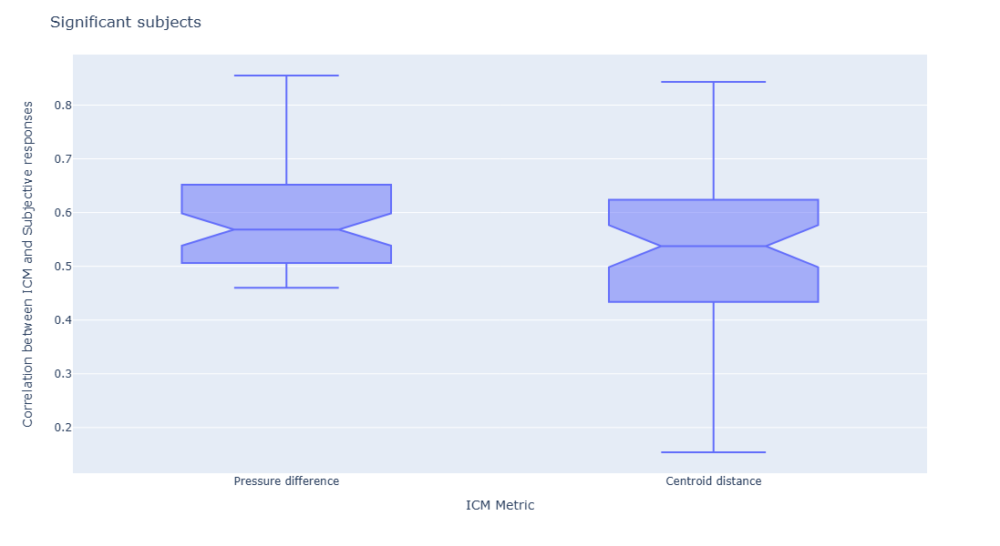

,Pressure difference,Centroid distance,slope_hour
count,58.000000,58.000000,58.000000
mean,0.591224,0.527707,2.493103
std,0.105012,0.144862,2.174750
min,0.460000,0.154000,0.120000
25%,0.507000,0.434250,0.960000
50%,0.568500,0.537500,1.680000
75%,0.648500,0.623250,3.435000
max,0.855000,0.843000,9.360000


In [30]:
display(df.shape)
df.rename(columns = {'corr_pressdiff':'Pressure difference', 'corr_centroid': 'Centroid distance'}, inplace = True)

fig = px.box(df,  y= ['Pressure difference', 'Centroid distance'], notched = True)
fig.update_layout(width=500, height=600,  xaxis_title = 'ICM Metric', yaxis_title = 'Correlation between ICM and Subjective responses', title = 'Significant subjects')
fig.show();
df.describe()

### Correlation for Higher slopes

In [31]:
df = read_corr_data()
df = df[df.pressurediff_pval == 'Correlated']
df = df[df.slope_direction == 'P']
display(df.shape)
df[:2]

(58, 9)

,subject,corr_pressdiff,corr_centroid,pressurediff_pval,Significant,slope_hour,slope_group,slope_direction,Weight_status
0,A001,0.575,0.404,Correlated,True,1.32,Below_3.1hrs,P,Healthy
22,A024,0.638,0.624,Correlated,True,0.96,Below_3.1hrs,P,Healthy


In [32]:
display(df.groupby(by='slope_group')[['slope_hour']].describe())
display(df.shape, df.pressurediff_pval.unique())

slope_hour                                                  
                  count      mean       std   min   25%   50%   75%   max
slope_group                                                              
Above_3.1hrs       19.0  5.052632  1.870784  3.00  3.63  4.68  6.09  9.36
Below_3.1hrs       39.0  1.246154  0.751730  0.12  0.63  1.14  1.68  2.82

(58, 9)

array(['Correlated'], dtype=object)

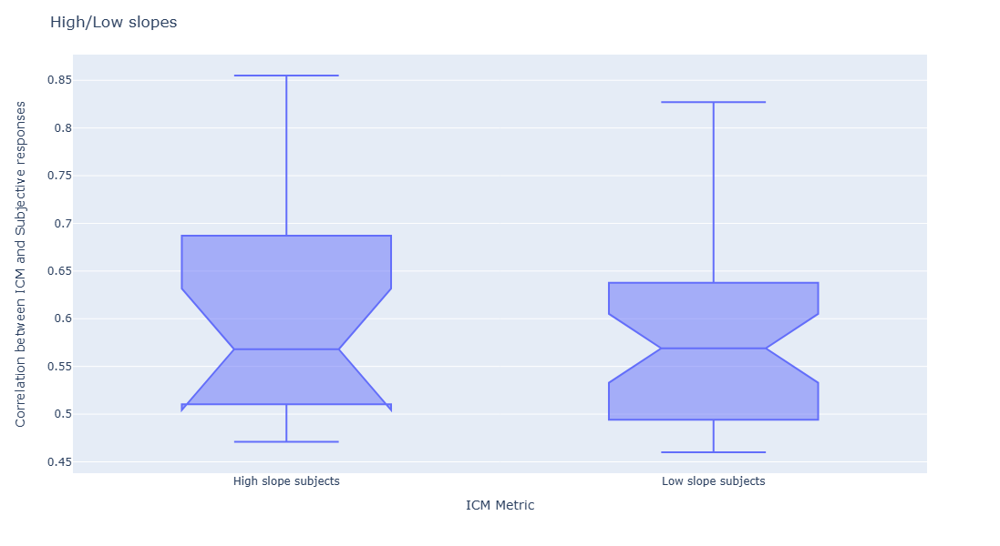

In [33]:
temp = df.copy()
temp['High slope subjects'] = df[df.slope_group == 'Above_3.1hrs']['corr_pressdiff']
temp['Low slope subjects'] = df[df.slope_group == 'Below_3.1hrs']['corr_pressdiff']

fig = px.box(temp,  y= ['High slope subjects', 'Low slope subjects'], notched = True)

fig.update_layout(width=500, height=600,  xaxis_title = 'ICM Metric', yaxis_title = 'Correlation between ICM and Subjective responses', title = 'High/Low slopes')
fig.show();

In [34]:
df = temp.copy()
all = ['High slope subjects', 'Low slope subjects']
#perform Kolmogorov-Smirnov test for normality
for icm_method in all:
    if shapiro(df.loc[df[icm_method].notna(), icm_method]).pvalue> 0.05:
        print('Normal')
    else:
        print('Not Normal')

statistic, test_pvalue = mannwhitneyu(df[df.slope_group == 'Above_3.1hrs']['corr_pressdiff'], df[df.slope_group == 'Below_3.1hrs']['corr_pressdiff'])
# Interpret the result (using a significance level of 0.05)
if test_pvalue < 0.05:
    print("Result: There is a significant difference between group means.")
else:
    print("Result: No significant difference between group means.", round(test_pvalue, 4))

Normal
Not Normal
Result: No significant difference between group means. 0.6487


### BMI comparison for Pressure difference ICM correlation

(208, 9)

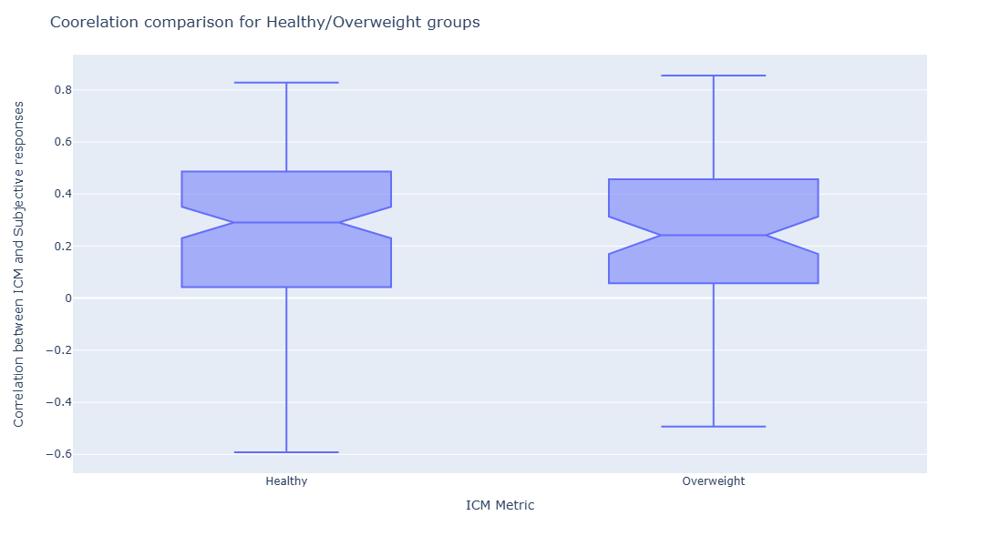

Normal
Normal
Result: No significant difference between group means. 0.5467


In [35]:
df = read_corr_data()
display(df.shape)
temp = pd.melt(df, id_vars= 'Weight_status', value_vars='corr_pressdiff', value_name='correlation')
fig = px.box(temp, x = 'Weight_status',  y= ['correlation'], notched = True)

fig.update_layout(width=500, height=600,  xaxis_title = 'ICM Metric', yaxis_title = 'Correlation between ICM and Subjective responses', 
                  title = 'Coorelation comparison for Healthy/Overweight groups')
fig.show();
df = temp.copy()
all = ['Healthy', 'Overweight']
#perform Kolmogorov-Smirnov test for normality
for each_bmi in all:
    if shapiro(df.loc[df.Weight_status == each_bmi, 'correlation']).pvalue> 0.05:
        print('Normal')
    else:
        print('Not Normal')

statistic, test_pvalue = f_oneway(df.loc[df.Weight_status == all[0], 'correlation'], df.loc[df.Weight_status == all[1], 'correlation'])
# Interpret the result (using a significance level of 0.05)
if test_pvalue < 0.05:
    print("Result: There is a significant difference between group means.")
else:
    print("Result: No significant difference between group means.", round(test_pvalue, 4))

(58, 9)

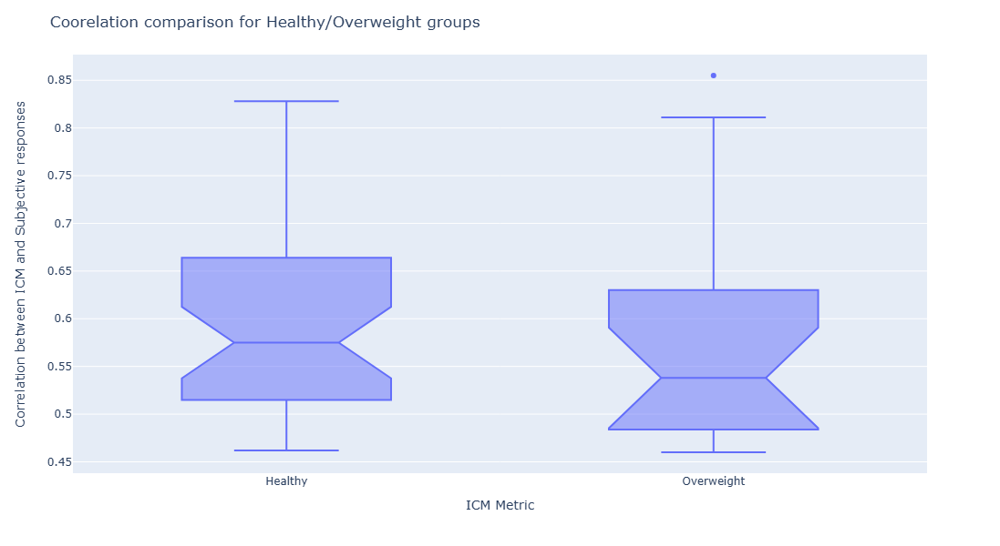

Not Normal
Not Normal
Result: No significant difference between group means. 0.3622


In [36]:
df = read_corr_data()
df = df[df.pressurediff_pval == 'Correlated']
df = df[df.slope_direction == 'P']

display(df.shape)

temp = pd.melt(df, id_vars= 'Weight_status', value_vars='corr_pressdiff', value_name='correlation')
fig = px.box(temp, x = 'Weight_status',  y= ['correlation'], notched = True)

fig.update_layout(width=500, height=600,  xaxis_title = 'ICM Metric', yaxis_title = 'Correlation between ICM and Subjective responses', 
                  title = 'Coorelation comparison for Healthy/Overweight groups')
fig.show();
df = temp.copy()
all = ['Healthy', 'Overweight']
#perform Kolmogorov-Smirnov test for normality
for each_bmi in all:
    if shapiro(df.loc[df.Weight_status == each_bmi, 'correlation']).pvalue> 0.05:
        print('Normal')
    else:
        print('Not Normal')

statistic, test_pvalue = mannwhitneyu(df.loc[df.Weight_status == all[0], 'correlation'], df.loc[df.Weight_status == all[1], 'correlation'])
# Interpret the result (using a significance level of 0.05)
if test_pvalue < 0.05:
    print("Result: There is a significant difference between group means.")
else:
    print("Result: No significant difference between group means.", round(test_pvalue, 4))

#### Low/High slopes in Healthy and Overweight groups

(58, 9)

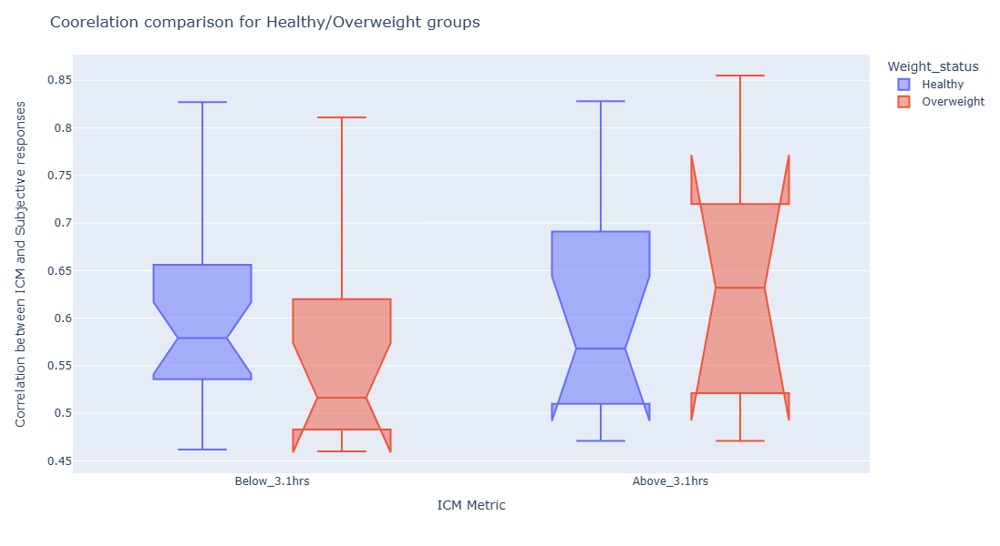

Normal
Not Normal
Result: No significant difference between group means. 0.1734
Normal
Normal
Result: No significant difference between group means. 0.5525


In [37]:
df = read_corr_data()
df = df[df.pressurediff_pval == 'Correlated']
df = df[df.slope_direction == 'P']
display(df.shape)

temp = pd.melt(df, id_vars= ['slope_group', 'Weight_status'], value_vars='corr_pressdiff', value_name='correlation')

fig = px.box(temp, x = 'slope_group',  y= ['correlation'], color = 'Weight_status', notched = True)
fig.update_layout(width=500, height=600,  xaxis_title = 'ICM Metric', yaxis_title = 'Correlation between ICM and Subjective responses', 
                  title = 'Coorelation comparison for Healthy/Overweight groups')
fig.show();

all = ['Healthy', 'Overweight']

#perform shapiro test for normality
for slope_group in df.slope_group.unique():
    df = temp.copy()
    df = df[df.slope_group == slope_group]
    normal_flag = 0
    for each_bmi in all:
        if shapiro(df.loc[df.Weight_status == each_bmi, 'correlation']).pvalue> 0.05:
            print('Normal')
            normal_flag += 1
        else:
            print('Not Normal')
    if normal_flag < 2:
        #print('***************', normal_flag)
        statistic, test_pvalue = mannwhitneyu(df.loc[df.Weight_status == all[0], 'correlation'], df.loc[df.Weight_status == all[1], 'correlation'])
    else:
        #print('***************', normal_flag)
        statistic, test_pvalue = f_oneway(df.loc[df.Weight_status == all[0], 'correlation'], df.loc[df.Weight_status == all[1], 'correlation'])
    # Interpret the result (using a significance level of 0.05)
    if test_pvalue < 0.05:
        print("Result: There is a significant difference between group means.")
    else:
        print("Result: No significant difference between group means.", round(test_pvalue, 4))